<a href="https://colab.research.google.com/github/samuel-shaibu/Restaurant-Location/blob/main/book.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INGESTION

In [18]:
#Import necessary modules
import folium
import pandas as pd
import numpy
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files

In [2]:
uploaded = files.upload()

Saving Dataset-RR.csv to Dataset-RR.csv


In [3]:
df = pd.read_csv('Dataset-RR.csv')

In [4]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [5]:
df.shape

(9551, 21)

In [6]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [7]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [12]:
# Required Columns
col = ['Latitude','Longitude','Locality','Aggregate rating','Cuisines','Price range', 'Restaurant Name']

# Keep only the required columns
df = df[col]

# print the required columns
print("The necessary columns:\n", df.columns)

The necessary columns:
 Index(['Latitude', 'Longitude', 'Locality', 'Aggregate rating', 'Cuisines',
       'Price range', 'Restaurant Name'],
      dtype='object')


In [13]:
# Drop the missing values
df.dropna(inplace=True)

In [14]:
df.isnull().sum()

,0
Latitude,0
Longitude,0
Locality,0
Aggregate rating,0
Cuisines,0
Price range,0
Restaurant Name,0


# EDA

In [26]:

# Create a map centered around a general area
latitude, longitude = df['Latitude'].mean(), df['Longitude'].mean()
restaurant_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# Add restaurant Markers
for _, row in df.iterrows():
    folium.Marker(
        [row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name']
    ).add_to(restaurant_map)

# Display the map
restaurant_map

<ipython-input-20-6cc86f9c9d94>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=locality_counts.index[:20], y=locality_counts.values[:20], palette="viridis")


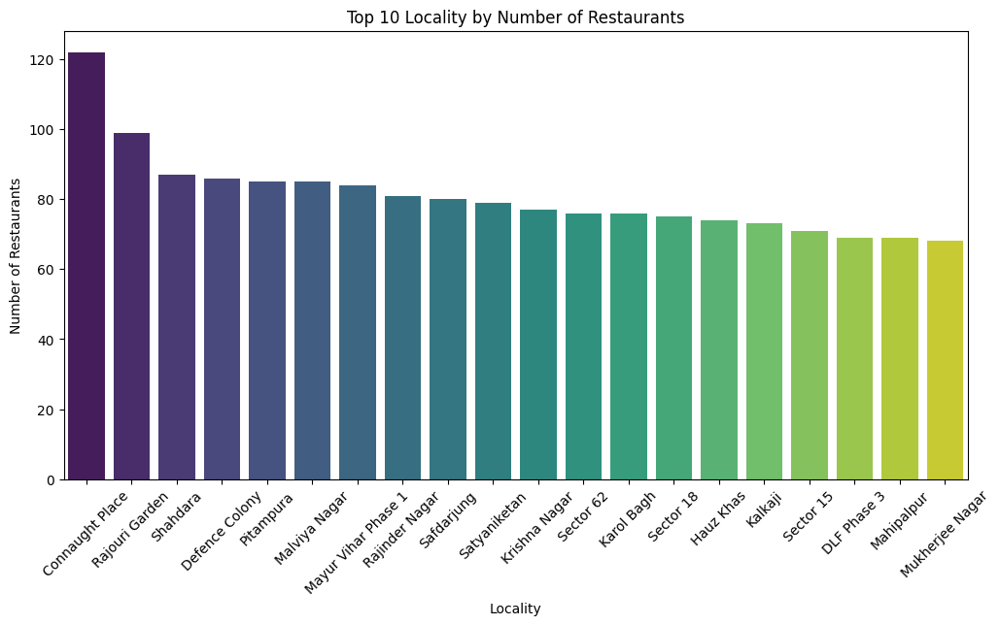

In [20]:
#Group by Locality
locality_counts = df['Locality'].value_counts()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=locality_counts.index[:20], y=locality_counts.values[:20], palette="viridis")
plt.title('Top 10 Locality by Number of Restaurants')
plt.xlabel("Locality")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()

In [21]:
# Average ratings by locality
avg_rating = df.groupby('Locality')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Ratings by Locality: \n", avg_rating.head(10))

Average Ratings by Locality: 
 Locality
Caddebostan                                    4.9
Venetian Village, Al Maqtaa                    4.9
Hotel Clarks Amer, Malviya Nagar               4.9
DIFC                                           4.9
The Milk District                              4.9
Aminabad                                       4.9
Kenwood                                        4.9
Taman Impian Jaya Ancol, Ancol                 4.9
Sofitel Philippine Plaza Manila, Pasay City    4.9
Setor De Clubes Esportivos Sul                 4.9
Name: Aggregate rating, dtype: float64


In [22]:
# Most Frequent Cuisines by Locality
cuisines_by_locality = df.groupby('Locality')['Cuisines'].apply(lambda x: x.mode()[0])
print("Most common Cuisines by Locality: \n", cuisines_by_locality.head(10))

Most common Cuisines by Locality: 
 Locality
 ILD Trade Centre Mall, Sohna Road                                                   Cafe, Beverages
12th Square Building, Banjara Hills                                   Mughlai, North Indian, Chinese
A Hotel, Gurdev Nagar                                               North Indian, Chinese, Fast Food
ARSS Mall, Paschim Vihar                           North Indian, South Indian, Chinese, Mithai, F...
Aaya Nagar                                                                            Cuisine Varies
Abu Dhabi Mall, Tourist Club Area  (Al Zahiyah)                                             American
Abu Shagara                                                   Indian, Mughlai, South Indian, Biryani
Acropolis Mall, Kasba                                                                 Asian, Chinese
Adajan Gam                                                   Chinese, North Indian, Italian, Mexican
Adchini                                       

In [23]:
# Price range statistics by locality
price_stats = df.groupby('Locality')['Price range'].describe()
print("Price Range Statistics:\n", price_stats.head(10))

Price Range Statistics:
                                                  count      mean       std  \
Locality                                                                     
 ILD Trade Centre Mall, Sohna Road                 2.0  1.500000  0.707107   
12th Square Building, Banjara Hills                1.0  3.000000       NaN   
A Hotel, Gurdev Nagar                              1.0  2.000000       NaN   
ARSS Mall, Paschim Vihar                           1.0  2.000000       NaN   
Aaya Nagar                                         1.0  2.000000       NaN   
Abu Dhabi Mall, Tourist Club Area  (Al Zahiyah)    2.0  4.000000  0.000000   
Abu Shagara                                        3.0  3.333333  0.577350   
Acropolis Mall, Kasba                              2.0  3.000000  0.000000   
Adajan Gam                                         3.0  2.666667  0.577350   
Adchini                                           13.0  2.000000  0.912871   

                                      

In [24]:
# Correlation between ratings and price range
correlation = df[['Aggregate rating', 'Price range']].corr()
print('print correlation between Aggregate rating and Price range:\n',correlation)

print correlation between Aggregate rating and Price range:
                   Aggregate rating  Price range
Aggregate rating          1.000000     0.438356
Price range               0.438356     1.000000


In [25]:
# High rated restaurants by Locality
high_rated = df[df['Aggregate rating'] >=4.5].groupby('Locality')['Restaurant Name'].count()
print("Localities with the Most High-rated Restaurants:\n", high_rated.sort_values(ascending=False,).head())

Localities with the Most High-rated Restaurants:
 Locality
Rajouri Garden    5
Macon             4
Savannah          4
Ipanema           3
Augusta           3
Name: Restaurant Name, dtype: int64
